# Milestone Check-in

## Data Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
DATA_ROOT = "/content/drive/MyDrive/final_project_dataset"

In [ ]:
import os

os.listdir(DATA_ROOT)

['LABELS.md',
 '.DS_Store',
 'FallDetection',
 'CAUCAFall',
 'labels',
 'OOPs',
 'GMDCSA24',
 'le2i',
 'of-syn',
 'parquet',
 'add_falldection.py',
 'enrich_videos_ffprobe.py',
 'main.py',
 'falldetection_dataloader.py']

In [ ]:
import pandas as pd
import numpy as np

label_path = os.path.join(DATA_ROOT, "labels", "GMDCSA24.csv")

df = pd.read_csv(label_path)

df.head()

,path,label,start,end,subject,cam,dataset
0,Subject_1/ADL/01,4,0.0,0.50,1,1,GMDCSA24
1,Subject_1/ADL/02,4,0.0,0.40,1,1,GMDCSA24
2,Subject_1/ADL/03,4,0.0,0.40,1,1,GMDCSA24
3,Subject_1/ADL/04,6,0.0,1.14,1,1,GMDCSA24
4,Subject_1/ADL/06,4,0.0,0.70,1,1,GMDCSA24


In [ ]:
import os
import glob
import pandas as pd

# ----------------------------
# 1. Set paths
# ----------------------------

DATA_ROOT = "/content/drive/MyDrive/final_project_dataset"
GMD_ROOT = os.path.join(DATA_ROOT, "GMDCSA24")
LABEL_CSV = os.path.join(DATA_ROOT, "labels", "GMDCSA24.csv")

# ----------------------------
# 2. Load labels
# ----------------------------

df = pd.read_csv(LABEL_CSV)

print("Label rows:", len(df))
print(df.head())

# ----------------------------
# 3. Build path resolver
# ----------------------------

def resolve_gmd_video_path(label_path):
    """
    Convert label CSV path like:
        Subject_1/ADL/01
    into actual Drive path like:
        GMDCSA24/Subject 1/ADL/01.mp4
    """

    # Fix folder naming mismatch: Subject_1 -> Subject 1
    rel_path = label_path.replace("Subject_", "Subject ")

    # Expected exact .mp4 path
    candidate = os.path.join(GMD_ROOT, rel_path + ".mp4")

    if os.path.exists(candidate):
        return candidate

    # Fallback: try any extension
    pattern = os.path.join(GMD_ROOT, rel_path + ".*")
    matches = glob.glob(pattern)

    if len(matches) > 0:
        return matches[0]

    return None

# ----------------------------
# 4. Apply resolver
# ----------------------------

df["video_path"] = df["path"].apply(resolve_gmd_video_path)
df["video_exists"] = df["video_path"].apply(lambda x: x is not None and os.path.exists(x))

# ----------------------------
# 5. Check match quality
# ----------------------------

num_total = len(df)
num_matched = df["video_exists"].sum()

print(f"Matched {num_matched}/{num_total} rows")
print(f"Match rate: {num_matched / num_total:.2%}")

print("\nUnmatched examples:")
print(df[df["video_exists"] == False].head(20))

# ----------------------------
# 6. Save matched labels
# ----------------------------

OUTPUT_CSV = os.path.join(DATA_ROOT, "labels", "GMDCSA24_matched.csv")

df.to_csv(OUTPUT_CSV, index=False)

print("\nSaved to:")
print(OUTPUT_CSV)

# ----------------------------
# 7. Preview one matched video
# ----------------------------

from IPython.display import Video, display

matched_df = df[df["video_exists"]].copy()

row = matched_df.iloc[0]

print("\nExample matched row:")
print(row[["path", "label", "start", "end", "subject", "cam", "dataset", "video_path"]])

display(Video(row["video_path"], embed=True))

Label rows: 458
               path  label  start   end  subject  cam   dataset
0  Subject_1/ADL/01      4    0.0  0.50        1    1  GMDCSA24
1  Subject_1/ADL/02      4    0.0  0.40        1    1  GMDCSA24
2  Subject_1/ADL/03      4    0.0  0.40        1    1  GMDCSA24
3  Subject_1/ADL/04      6    0.0  1.14        1    1  GMDCSA24
4  Subject_1/ADL/06      4    0.0  0.70        1    1  GMDCSA24
Matched 458/458 rows
Match rate: 100.00%

Unmatched examples:
Empty DataFrame
Columns: [path, label, start, end, subject, cam, dataset, video_path, video_exists]
Index: []

Saved to:
/content/drive/MyDrive/final_project_dataset/labels/GMDCSA24_matched.csv

Example matched row:
path                                           Subject_1/ADL/01
label                                                         4
start                                                       0.0
end                                                         0.5
subject                                                       1
ca

In [ ]:
label_map_path = os.path.join(
    DATA_ROOT,
    "labels",
    "label2id.csv"
)

label_map = pd.read_csv(
    os.path.join(DATA_ROOT, "labels", "label2id.csv")
)
print(label_map)

         label  id
0         walk   0
1         fall   1
2       fallen   2
3     sit_down   3
4      sitting   4
5     lie_down   5
6        lying   6
7     stand_up   7
8     standing   8
9        other   9
10  kneel_down  10
11    kneeling  11
12  squat_down  12
13   squatting  13
14       crawl  14
15        jump  15


In [ ]:
df

,path,label,start,end,subject,cam,dataset,video_path,video_exists
0,Subject_1/ADL/01,4,0.000,0.50000,1,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True
1,Subject_1/ADL/02,4,0.000,0.40000,1,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True
2,Subject_1/ADL/03,4,0.000,0.40000,1,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True
3,Subject_1/ADL/04,6,0.000,1.14000,1,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True
4,Subject_1/ADL/06,4,0.000,0.70000,1,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True
...,...,...,...,...,...,...,...,...,...
453,Subject_4/ADL/16,6,5.778,7.15181,4,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True
454,Subject_4/ADL/10,6,7.008,12.79514,4,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True
455,Subject_4/ADL/14,8,7.237,8.31700,4,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True
456,Subject_4/ADL/08,4,7.487,8.48700,4,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True


In [ ]:
id2label = dict(zip(label_map["id"], label_map["label"]))

df["label_name"] = df["label"].map(id2label)

label_counts = (
    df.groupby(["label", "label_name"])
      .size()
      .reset_index(name="num_videos")
      .sort_values("num_videos", ascending=False)
)

print(label_counts)

   label label_name  num_videos
1      1       fall          78
2      2     fallen          77
9      9      other          72
0      0       walk          65
4      4    sitting          63
8      8   standing          37
3      3   sit_down          22
7      7   stand_up          17
6      6      lying          14
5      5   lie_down          13


In [ ]:
df

,path,label,start,end,subject,cam,dataset,video_path,video_exists,label_name
0,Subject_1/ADL/01,4,0.000,0.50000,1,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True,sitting
1,Subject_1/ADL/02,4,0.000,0.40000,1,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True,sitting
2,Subject_1/ADL/03,4,0.000,0.40000,1,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True,sitting
3,Subject_1/ADL/04,6,0.000,1.14000,1,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True,lying
4,Subject_1/ADL/06,4,0.000,0.70000,1,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True,sitting
...,...,...,...,...,...,...,...,...,...,...
453,Subject_4/ADL/16,6,5.778,7.15181,4,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True,lying
454,Subject_4/ADL/10,6,7.008,12.79514,4,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True,lying
455,Subject_4/ADL/14,8,7.237,8.31700,4,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True,standing
456,Subject_4/ADL/08,4,7.487,8.48700,4,1,GMDCSA24,/content/drive/MyDrive/final_project_dataset/G...,True,sitting


In [ ]:
df["start_is_zero"] = df["start"] <= 1e-6

# ----------------------------
# Aggregate statistics
# ----------------------------

stats = (
    df.groupby("label_name")
      .agg(
          total_clips=("label_name", "count"),
          start_zero=("start_is_zero", "sum")
      )
      .reset_index()
)

stats["pct_start_zero"] = (
    stats["start_zero"] / stats["total_clips"]
)

# Sort by percentage
stats = stats.sort_values(
    "pct_start_zero",
    ascending=False
)

print(stats)

  label_name  total_clips  start_zero  pct_start_zero
6    sitting           63          41        0.650794
9       walk           65          36        0.553846
8   standing           37          17        0.459459
4      other           72          31        0.430556
7   stand_up           17           7        0.411765
2   lie_down           13           4        0.307692
3      lying           14           3        0.214286
5   sit_down           22           3        0.136364
0       fall           78           6        0.076923
1     fallen           77           0        0.000000


## Video Data Preprocessing

In [ ]:
import cv2

row = df.iloc[0]

video_path = row["video_path"]

cap = cv2.VideoCapture(video_path)

fps = cap.get(cv2.CAP_PROP_FPS)
num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

cap.release()

print("Video:", video_path)
print("FPS:", fps)
print("Frames:", num_frames)
print("Duration:", num_frames / fps)

Video: /content/drive/MyDrive/final_project_dataset/GMDCSA24/Subject 1/ADL/01.mp4
FPS: 29.61249929494049
Frames: 245
Duration: 8.273533333333333


In [ ]:
usable_falls = df[
    (df["label_name"] == "fall") &
    (df["start"] > 1.0)
]

print(len(usable_falls))

55


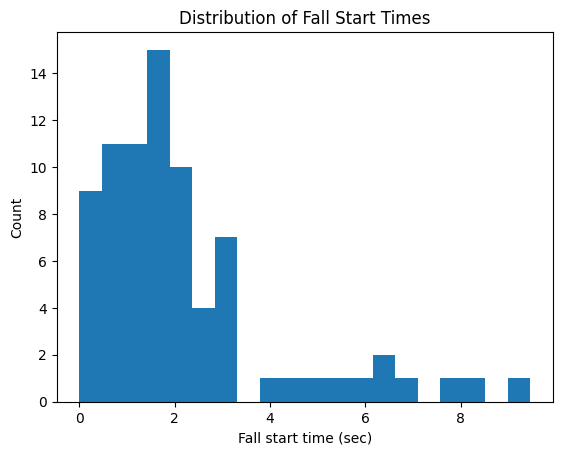

In [ ]:
import matplotlib.pyplot as plt

fall_df = df[df["label_name"] == "fall"]

plt.hist(fall_df["start"], bins=20)

plt.xlabel("Fall start time (sec)")
plt.ylabel("Count")
plt.title("Distribution of Fall Start Times")

plt.show()

### Task Setup

In [ ]:
import cv2
import numpy as np

# ======================================================
# CONFIG
# ======================================================

TARGET_FPS = 10

OBS_SEC = 1.6
HORIZON_SEC = 1.0
STRIDE_SEC = 0.2

OBS_LEN = int(OBS_SEC * TARGET_FPS)       # 16
K_FRAMES = int(HORIZON_SEC * TARGET_FPS)  # 10
STRIDE = int(STRIDE_SEC * TARGET_FPS)     # 2

POSITIVE_LABEL = "fall"

NEGATIVE_LABELS = {
    "walk",
    "sitting",
    "standing",
    "sit_down",
    "stand_up",
    "lie_down",
    "lying",
    "other",
}

EXCLUDE_LABELS = {
    "fallen"
}

### Video Metadata Helper

In [ ]:
def get_video_info(video_path):

    cap = cv2.VideoCapture(video_path)

    fps = cap.get(cv2.CAP_PROP_FPS)
    n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    cap.release()

    if fps <= 0 or n_frames <= 0:
        return None

    return fps, n_frames

### Build Window Level Samples

In [ ]:
def build_windows_for_row(row):
    # -----------------------------
    # Robust label handling
    # -----------------------------
    label_name = str(row.get("label_name", "")).strip().lower()

    if label_name == "" or label_name == "nan":
        return []

    # Skip excluded labels
    if label_name in EXCLUDE_LABELS:
        return []

    # Keep only positive + negative labels
    if label_name != POSITIVE_LABEL and label_name not in NEGATIVE_LABELS:
        return []

    # -----------------------------
    # Video info
    # -----------------------------
    video_path = row.get("video_path", None)

    if video_path is None or pd.isna(video_path):
        return []

    video_path = str(video_path)

    if not os.path.exists(video_path):
        return []

    result = get_video_info(video_path)

    if result is None:
        return []

    original_fps, n_original_frames = result

    if original_fps is None or n_original_frames is None:
        return []

    # -----------------------------
    # Convert to sampled-frame space
    # -----------------------------
    sample_interval = max(1, int(round(original_fps / TARGET_FPS)))

    n_sampled_frames = int(np.ceil(n_original_frames / sample_interval))

    # Need enough frames to form at least one window
    if n_sampled_frames <= OBS_LEN + K_FRAMES:
        return []

    # -----------------------------
    # Fall onset frame
    # -----------------------------
    fall_start_sampled = None

    if label_name == POSITIVE_LABEL:
        fall_start_original = int(float(row["start"]) * original_fps)
        fall_start_sampled = int(fall_start_original / sample_interval)

        # If fall starts too early, no valid anticipation window
        if fall_start_sampled <= OBS_LEN:
            return []

    # -----------------------------
    # Build sliding windows
    # -----------------------------
    samples = []

    for t in range(OBS_LEN, n_sampled_frames - K_FRAMES, STRIDE):

        if label_name == POSITIVE_LABEL:
            # Positive if fall starts within next K frames
            y = int(t < fall_start_sampled <= t + K_FRAMES)

            # Skip windows after fall starts
            if t >= fall_start_sampled:
                continue
        else:
            y = 0

        sample = {
            "video_path": video_path,
            "label_name": label_name,

            "subject": row["subject"],
            "cam": row["cam"],
            "dataset": row.get("dataset", None),

            "window_start": t - OBS_LEN,
            "window_end": t,
            "target_frame": t,

            "obs_len": OBS_LEN,
            "k_frames": K_FRAMES,

            "target_fps": TARGET_FPS,
            "sample_interval": sample_interval,

            "y": y,
            "fall_start_frame": fall_start_sampled if fall_start_sampled is not None else np.nan,
        }

        samples.append(sample)

    return samples

### Create Dataset

In [ ]:
all_samples = []

for _, row in df.iterrows():
    all_samples.extend(build_windows_for_row(row))

windows_df = pd.DataFrame(all_samples)

print(windows_df.shape)
print(windows_df["y"].value_counts())
print(windows_df["label_name"].value_counts())

(9691, 14)
y
0    9546
1     145
Name: count, dtype: int64
label_name
other       2303
walk        1895
sitting     1816
standing    1093
sit_down     783
stand_up     624
lie_down     412
lying        392
fall         373
Name: count, dtype: int64


In [ ]:
import os
import cv2
import torch
import numpy as np
import pandas as pd

from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import GroupShuffleSplit

### Train Test Split

In [ ]:
# Split by subject
groups = windows_df["subject"]

gss = GroupShuffleSplit(
    n_splits=1,
    test_size=0.2,
    random_state=42
)

train_val_idx, test_idx = next(
    gss.split(windows_df, windows_df["y"], groups)
)

train_val_df = windows_df.iloc[train_val_idx].reset_index(drop=True)
test_df = windows_df.iloc[test_idx].reset_index(drop=True)

# Split train/val again by subject
groups_train_val = train_val_df["subject"]

gss_val = GroupShuffleSplit(
    n_splits=1,
    test_size=0.2,
    random_state=43
)

train_idx, val_idx = next(
    gss_val.split(train_val_df, train_val_df["y"], groups_train_val)
)

train_df = train_val_df.iloc[train_idx].reset_index(drop=True)
val_df = train_val_df.iloc[val_idx].reset_index(drop=True)

print("train:", train_df.shape, train_df["y"].value_counts())
print("val:", val_df.shape, val_df["y"].value_counts())
print("test:", test_df.shape, test_df["y"].value_counts())

train: (3094, 14) y
0    3075
1      19
Name: count, dtype: int64
val: (2638, 14) y
0    2597
1      41
Name: count, dtype: int64
test: (3959, 14) y
0    3874
1      85
Name: count, dtype: int64


In [ ]:
def load_video_window(
    video_path,
    window_start,
    window_end,
    sample_interval,
    resize=(224, 224)
):
    """
    Loads frames from original video corresponding to sampled-frame indices.

    window_start/window_end are in sampled-frame space.
    sample_interval maps sampled-frame index -> original-frame index.
    """

    cap = cv2.VideoCapture(video_path)

    frames = []

    for sampled_idx in range(window_start, window_end):
        original_idx = int(sampled_idx * sample_interval)

        cap.set(cv2.CAP_PROP_POS_FRAMES, original_idx)
        success, frame = cap.read()

        if not success:
            break

        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame = cv2.resize(frame, resize)

        frame = frame.astype(np.float32) / 255.0

        frames.append(frame)

    cap.release()

    return frames

In [ ]:
class FallWindowDataset(Dataset):
    def __init__(self, windows_df, resize=(224, 224)):
        self.df = windows_df.reset_index(drop=True)
        self.resize = resize

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        video_path = row["video_path"]
        window_start = int(row["window_start"])
        window_end = int(row["window_end"])
        sample_interval = int(row["sample_interval"])

        frames = load_video_window(
            video_path=video_path,
            window_start=window_start,
            window_end=window_end,
            sample_interval=sample_interval,
            resize=self.resize
        )

        # Pad if video read returned too few frames
        if len(frames) < row["obs_len"]:
            if len(frames) == 0:
                frames = [
                    np.zeros(
                        (self.resize[1], self.resize[0], 3),
                        dtype=np.float32
                    )
                ]

            while len(frames) < row["obs_len"]:
                frames.append(frames[-1].copy())

        # Trim just in case
        frames = frames[: int(row["obs_len"])]

        video = np.stack(frames, axis=0)  # [T, H, W, C]
        video = torch.from_numpy(video).permute(0, 3, 1, 2)  # [T, C, H, W]

        label = torch.tensor(row["y"], dtype=torch.long)

        return video, label

In [ ]:
BATCH_SIZE = 8

train_dataset = FallWindowDataset(train_df, resize=(224, 224))
val_dataset = FallWindowDataset(val_df, resize=(224, 224))
test_dataset = FallWindowDataset(test_df, resize=(224, 224))

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

In [ ]:
videos, labels = next(iter(train_loader))

print(videos.shape)
print(labels.shape)
print(labels)

torch.Size([8, 16, 3, 224, 224])
torch.Size([8])
tensor([0, 0, 0, 0, 0, 0, 0, 0])


## Baseline

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

In [ ]:
class SimpleVideoCNN(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()

        self.frame_encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),   # 224 -> 112

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),   # 112 -> 56

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.AdaptiveAvgPool2d((1, 1))
        )

        self.classifier = nn.Sequential(
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        # x: [B, T, C, H, W]
        B, T, C, H, W = x.shape

        # Merge batch and time
        x = x.view(B * T, C, H, W)

        feats = self.frame_encoder(x)      # [B*T, 128, 1, 1]
        feats = feats.view(B, T, 128)      # [B, T, 128]

        # Simple temporal average pooling
        video_feat = feats.mean(dim=1)     # [B, 128]

        logits = self.classifier(video_feat)

        return logits

In [ ]:
def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()

    total_loss = 0.0
    correct = 0
    total = 0

    for videos, labels in tqdm(loader, desc="Training"):
        videos = videos.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        logits = model(videos)
        loss = criterion(logits, labels)

        loss.backward()
        optimizer.step()

        total_loss += loss.item() * videos.size(0)

        preds = torch.argmax(logits, dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    avg_loss = total_loss / total
    acc = correct / total

    return avg_loss, acc


@torch.no_grad()
def evaluate(model, loader, criterion, device):
    model.eval()

    total_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    for videos, labels in tqdm(loader, desc="Evaluating"):
        videos = videos.to(device)
        labels = labels.to(device)

        logits = model(videos)
        loss = criterion(logits, labels)

        total_loss += loss.item() * videos.size(0)

        preds = torch.argmax(logits, dim=1)

        correct += (preds == labels).sum().item()
        total += labels.size(0)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    avg_loss = total_loss / total
    acc = correct / total

    return avg_loss, acc, all_preds, all_labels

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

model = SimpleVideoCNN(num_classes=2).to(device)

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    model.parameters(),
    lr=1e-4,
    weight_decay=1e-4
)

NUM_EPOCHS = 1

best_val_loss = float("inf")

for epoch in range(NUM_EPOCHS):
    print(f"\nEpoch {epoch + 1}/{NUM_EPOCHS}")

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        optimizer,
        criterion,
        device
    )

    val_loss, val_acc, _, _ = evaluate(
        model,
        val_loader,
        criterion,
        device
    )

    print(f"Train loss: {train_loss:.4f} | Train acc: {train_acc:.4f}")
    print(f"Val loss:   {val_loss:.4f} | Val acc:   {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss

        torch.save(
            {
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "epoch": epoch,
                "val_loss": val_loss,
                "val_acc": val_acc,
            },
            "best_simple_video_cnn.pt"
        )

        print("Saved best model.")

cuda

Epoch 1/1


Evaluating: 100%|██████████| 330/330 [2:06:30<00:00, 23.00s/it]

Train loss: 0.1317 | Train acc: 0.9939
Val loss:   0.0786 | Val acc:   0.9845
Saved best model.


In [ ]:
checkpoint = torch.load("best_simple_video_cnn.pt", map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])

test_loss, test_acc, test_preds, test_labels = evaluate(
    model,
    test_loader,
    criterion,
    device
)

print(f"Test loss: {test_loss:.4f}")
print(f"Test acc:  {test_acc:.4f}")

Evaluating:  16%|█▌        | 79/495 [33:11<3:02:42, 26.35s/it]